In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import matplotlib.dates as mdates
import seaborn as sns

In [2]:
BASE = Path("../data/raw")
X_train = pd.read_csv(BASE / "X_train_78VdSWL.csv", index_col=0, parse_dates=True)
y_train = pd.read_csv(BASE / "y_train_u0UkKEh.csv", index_col=0, parse_dates=True)

In [5]:
print("Index minimum:", X_train.index.min())
print("Jour de début:", X_train.index.min().weekday())
print("Index maximum:", X_train.index.max())
print("Jour de fin :", X_train.index.max().weekday())


Index minimum: 2023-01-09 00:00:00
Jour de début: 0
Index maximum: 2023-01-31 00:00:00
Jour de fin : 1


In [4]:
X_test = pd.read_csv(BASE / "X_test_XKVc4no.csv", index_col=0, parse_dates=True)

In [5]:
holed_cols = [c for c in X_train.columns if c.startswith("holed_")]
holed_cols_test = [c for c in X_test.columns if c.startswith("holed_")]

In [10]:
print(f"Il y a {X_train.loc[:,holed_cols].isna().sum().sum()} valeurs manquantes à trouver") 

Il y a 129909 valeurs manquantes à trouver


In [19]:
X_holed = X_train.loc[:,holed_cols]

In [23]:
X_holed.isna().sum()

holed_1       121
holed_2        60
holed_3       119
holed_4       207
holed_5       179
             ... 
holed_996     112
holed_997      71
holed_998     128
holed_999      89
holed_1000    219
Length: 1000, dtype: int64

In [3]:
X_train.shape
X_train.info()
X_train.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1057 entries, 2023-01-09 00:00:00 to 2023-01-31 00:00:00
Columns: 21000 entries, 5423908671 to holed_1000
dtypes: float64(21000)
memory usage: 169.4 MB


,5423908671,2568793410,8310762594,6235194807,423895617,193845276,216589743,218753964,1794650328,9253476180,...,holed_991,holed_992,holed_993,holed_994,holed_995,holed_996,holed_997,holed_998,holed_999,holed_1000
Horodate,,,,,,,,,,,,,,,,,,,,,
2023-01-09 00:00:00,352.0,0.0,371.0,110.0,724.0,102.0,256.0,7.0,105.0,44.0,...,0.0,32.0,152.0,NaN,0.0,1099.0,117.0,45.0,253.0,186.0
2023-01-09 00:30:00,405.0,0.0,363.0,108.0,478.0,147.0,281.0,8.0,134.0,36.0,...,0.0,34.0,84.0,NaN,NaN,782.0,109.0,40.0,227.0,180.0
2023-01-09 01:00:00,599.0,0.0,352.0,93.0,832.0,155.0,295.0,5.0,96.0,22.0,...,0.0,30.0,24.0,NaN,0.0,630.0,375.0,58.0,237.0,166.0
2023-01-09 01:30:00,315.0,0.0,348.0,84.0,574.0,152.0,267.0,15.0,156.0,12.0,...,0.0,34.0,24.0,NaN,0.0,773.0,468.0,48.0,245.0,525.0
2023-01-09 02:00:00,448.0,0.0,364.0,73.0,421.0,176.0,346.0,38.0,97.0,24.0,...,0.0,30.0,46.0,NaN,0.0,879.0,534.0,41.0,175.0,372.0


In [4]:
X_train.index.to_series().diff().value_counts().head()

Horodate
0 days 00:30:00    1056
Name: count, dtype: int64

### Tracé d'une courbe de consommation 

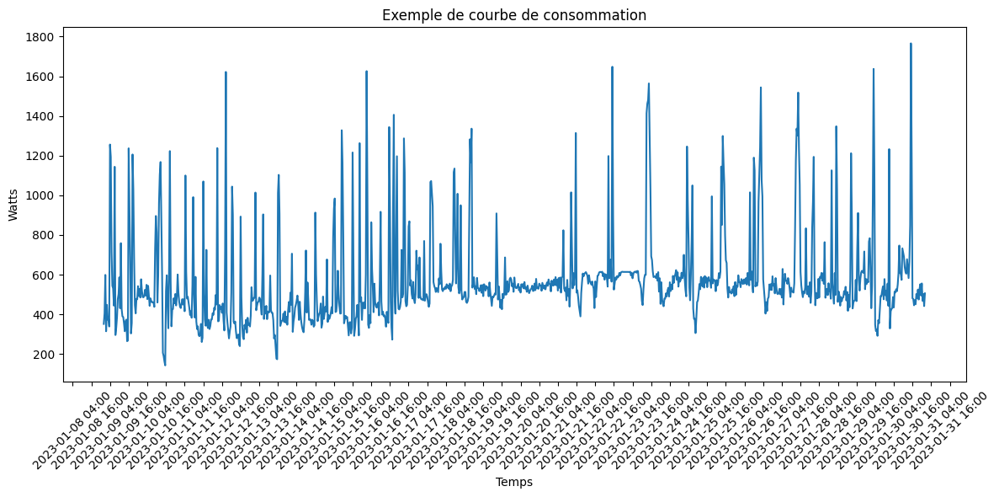

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(X_train.index, X_train.iloc[:, 0])

# Format x-axis to show dates nicely
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=12))

plt.title("Exemple de courbe de consommation")
plt.xlabel("Temps")
plt.ylabel("Watts")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent label cutoff
plt.tight_layout()

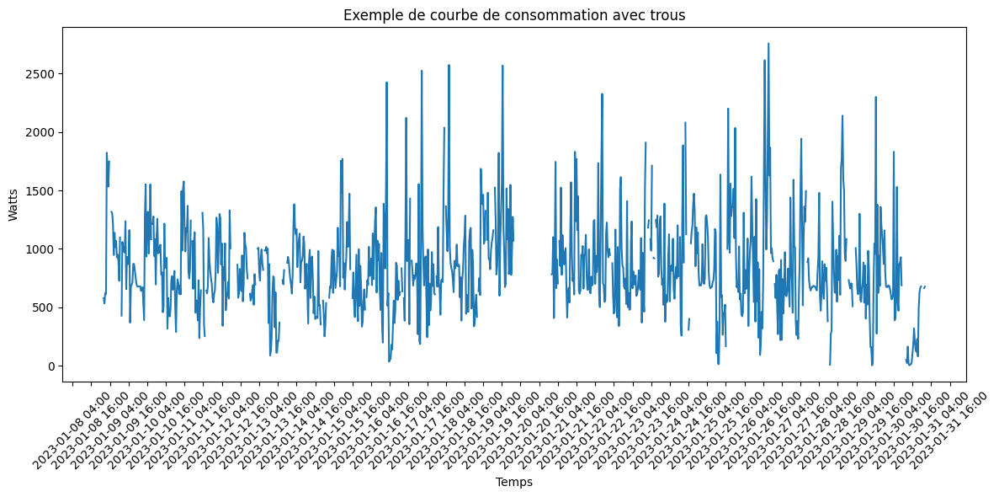

In [52]:
plt.figure(figsize=(12, 6))
plt.plot(X_train.index, X_train.loc[:, holed_cols[0]])

# Format x-axis to show dates nicely
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=12))

plt.title("Exemple de courbe de consommation avec trous")
plt.xlabel("Temps")
plt.ylabel("Watts")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent label cutoff
plt.tight_layout()

In [8]:
X_train.describe()

,5423908671,2568793410,8310762594,6235194807,423895617,193845276,216589743,218753964,1794650328,9253476180,...,holed_991,holed_992,holed_993,holed_994,holed_995,holed_996,holed_997,holed_998,holed_999,holed_1000
count,1057.000000,1057.000000,1057.000000,1057.000000,1057.000000,1057.000000,1057.000000,1057.000000,1057.000000,1057.000000,...,913.0,963.000000,928.000000,933.000000,918.0,945.000000,986.000000,929.000000,968.000000,838.000000
mean,567.010407,4.575213,814.052034,375.370861,1202.364238,187.719016,554.808893,18.550615,265.464522,82.440870,...,0.0,23.493250,40.172414,587.293676,0.0,1096.756614,187.293103,64.487621,114.547521,295.560859
std,225.700515,117.691471,485.858805,343.137069,345.274938,80.496774,278.262533,33.216826,228.233634,71.012233,...,0.0,8.952096,50.883271,427.655623,0.0,436.254909,134.089130,37.826397,125.393007,101.077649
min,143.000000,0.000000,23.000000,13.000000,201.000000,40.000000,0.000000,0.000000,60.000000,4.000000,...,0.0,9.000000,1.000000,10.000000,0.0,341.000000,46.000000,14.000000,9.000000,66.000000
25%,450.000000,0.000000,465.000000,83.000000,980.000000,126.000000,333.000000,0.000000,116.000000,33.000000,...,0.0,18.000000,16.000000,162.000000,0.0,650.000000,106.000000,41.000000,26.000000,222.250000
50%,526.000000,0.000000,802.000000,173.000000,1209.000000,177.000000,505.000000,2.000000,163.000000,60.000000,...,0.0,21.000000,24.000000,530.000000,0.0,1157.000000,130.000000,54.000000,42.000000,283.000000
75%,589.000000,0.000000,1111.000000,672.000000,1425.000000,234.000000,714.000000,37.000000,335.000000,110.000000,...,0.0,25.000000,41.000000,948.000000,0.0,1398.000000,216.000000,71.000000,195.250000,347.000000
max,1766.000000,3785.000000,2213.000000,1195.000000,2390.000000,499.000000,1693.000000,776.000000,1545.000000,429.000000,...,0.0,114.000000,410.000000,2134.000000,0.0,2462.000000,854.000000,252.000000,703.000000,727.000000


On remarque une disparité dans les niveaux de consommation entre les colonnes. 

### Observons la distribution du taux de données manquantes par colonne dans le jeu de données de train et de test.

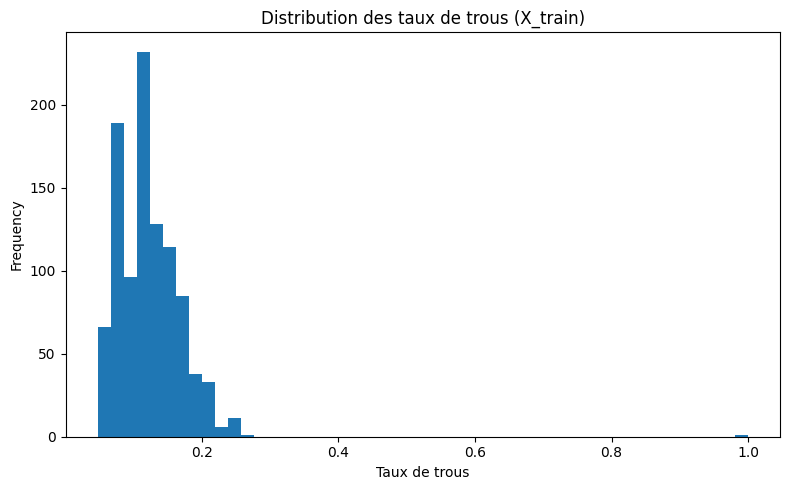

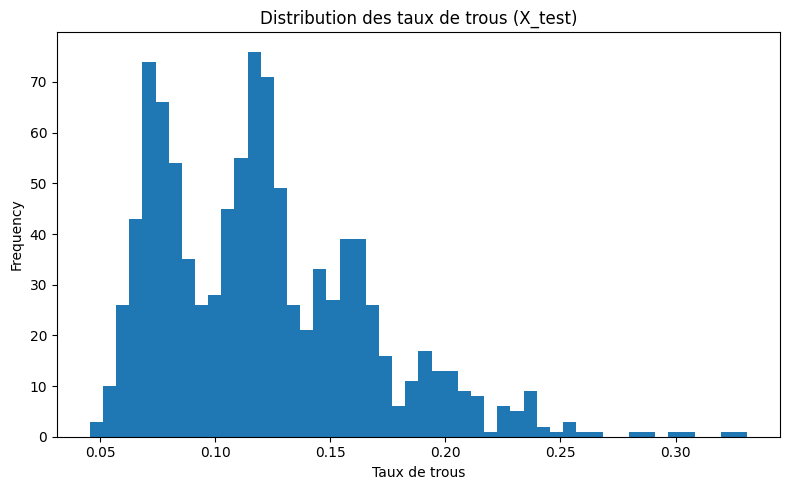

In [32]:
# Distribution des taux de trous pour X_train
plt.figure(figsize=(8, 5))
missing_rate_train = X_train[holed_cols].isna().mean().sort_values(ascending=False)
missing_rate_train.plot(kind="hist", bins=50, title="Distribution des taux de trous (X_train)")
plt.xlabel("Taux de trous")
plt.tight_layout()
plt.show()

# Distribution des taux de trous pour X_test
plt.figure(figsize=(8, 5))
missing_rate_test = X_test[holed_cols_test].isna().mean().sort_values(ascending=False)
missing_rate_test.plot(kind="hist", bins=50, title="Distribution des taux de trous (X_test)")
plt.xlabel("Taux de trous")
plt.tight_layout()
plt.show()


On remarque la présence d'un outlier dans les données d'entrainement avec près de 100% de données manquantes.

###  Regardons maintenant la distribution des moyennes de consommation des colonnes dans les données du jeu d'entraînement et de test.

Résumé des moyennes de consommation des données connues :
 count    20000.000000
mean       343.983740
std        368.723969
min          0.000000
25%         90.189688
50%        212.403027
75%        446.417455
max       2674.736045
dtype: float64


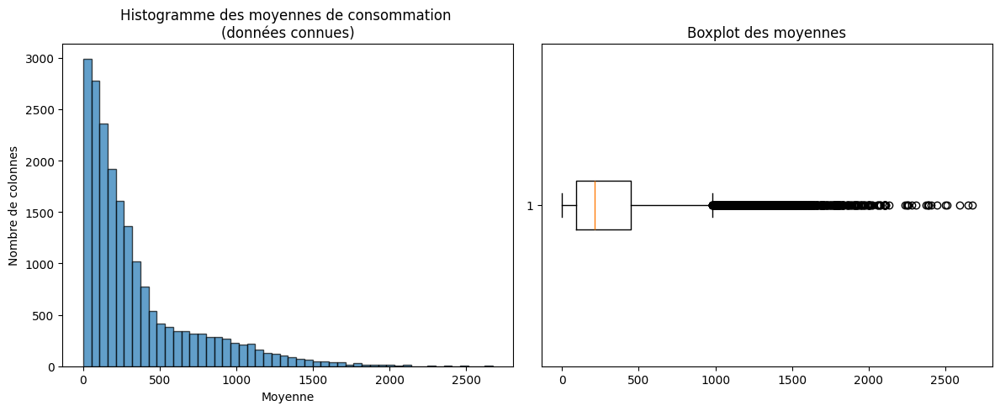

In [21]:
# Calculer les moyennes de chaque colonne en excluant les 1000 dernières colonnes
means = X_train.iloc[:, :-1000].mean(axis=0)

# Afficher un résumé numérique
print("Résumé des moyennes de consommation des données connues :\n", means.describe())

# Tracer la distribution : histogramme + boxplot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(means.dropna(), bins=50, color='C0', edgecolor='k', alpha=0.7)
plt.title("Histogramme des moyennes de consommation \n(données connues)")
plt.xlabel("Moyenne")
plt.ylabel("Nombre de colonnes")

plt.subplot(1, 2, 2)
plt.boxplot(means.dropna(), vert=False)
plt.title("Boxplot des moyennes")

plt.tight_layout()
plt.show()

In [20]:
X_train.loc[:, holed_cols].isna().mean().describe()

count    1000.000000
mean        0.122904
std         0.050179
min         0.048250
25%         0.086093
50%         0.117313
75%         0.152318
max         0.999054
dtype: float64

Résumé des moyennes de consommation des données manquantes :
 count    1000.000000
mean      354.183749
std       384.288474
min         0.000000
25%        86.708396
50%       209.519050
75%       477.455779
max      2647.766702
dtype: float64


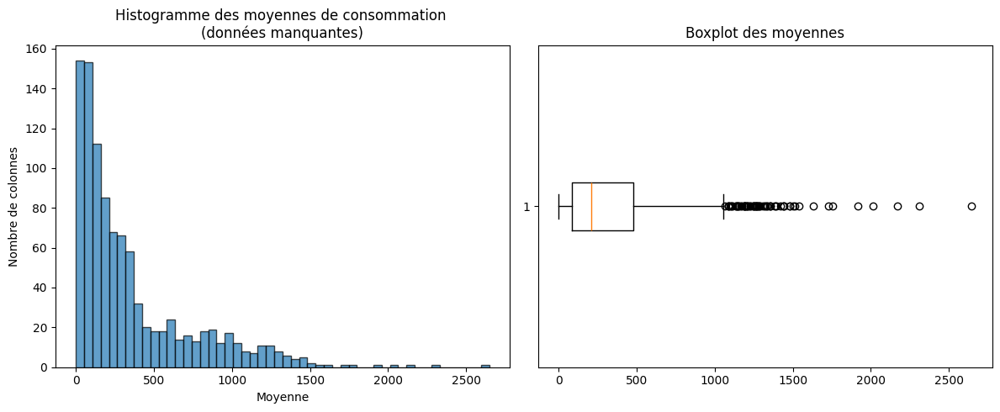

In [23]:
means = X_train.loc[:, holed_cols].mean(axis=0)

# Afficher un résumé numérique
print("Résumé des moyennes de consommation des données manquantes :\n", means.describe())

# Tracer la distribution : histogramme + boxplot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(means.dropna(), bins=50, color='C0', edgecolor='k', alpha=0.7)
plt.title("Histogramme des moyennes de consommation \n(données manquantes)")
plt.xlabel("Moyenne")
plt.ylabel("Nombre de colonnes")

plt.subplot(1, 2, 2)
plt.boxplot(means.dropna(), vert=False)
plt.title("Boxplot des moyennes")

plt.tight_layout()
plt.show()

Résumé des moyennes de consommation des données connues :
 count    37140.000000
mean       341.112766
std        365.688638
min          0.000000
25%         88.924551
50%        211.305582
75%        438.240066
max       2685.000000
dtype: float64


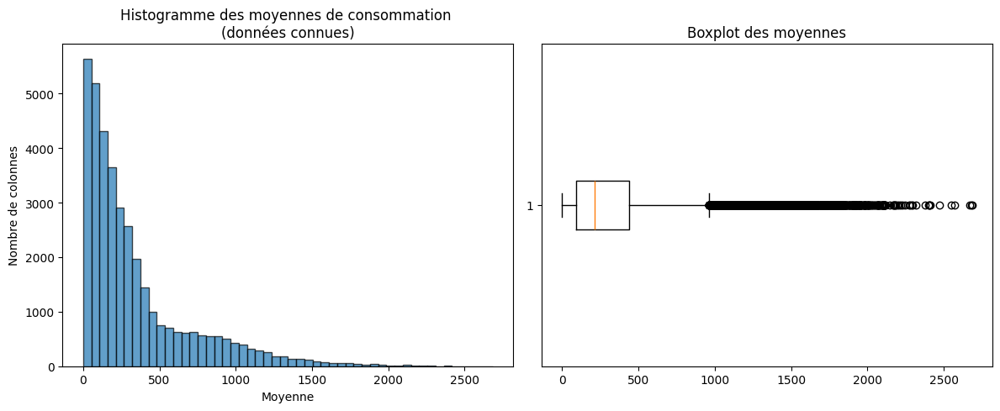

In [29]:
# Calculer les moyennes de chaque colonne en excluant les 1000 dernières colonnes
means_test = X_test.iloc[:, :-1000].mean(axis=0)

# Afficher un résumé numérique
print("Résumé des moyennes de consommation des données connues :\n", means_test.describe())

# Tracer la distribution : histogramme + boxplot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(means_test.dropna(), bins=50, color='C0', edgecolor='k', alpha=0.7)
plt.title("Histogramme des moyennes de consommation \n(données connues)")
plt.xlabel("Moyenne")
plt.ylabel("Nombre de colonnes")

plt.subplot(1, 2, 2)
plt.boxplot(means_test.dropna(), vert=False)
plt.title("Boxplot des moyennes")

plt.tight_layout()
plt.show()

Résumé des moyennes de consommation des données manquantes :
 count    1000.000000
mean      348.740714
std       363.135590
min         0.000000
25%       101.099798
50%       217.805917
75%       445.639562
max      1803.473958
dtype: float64


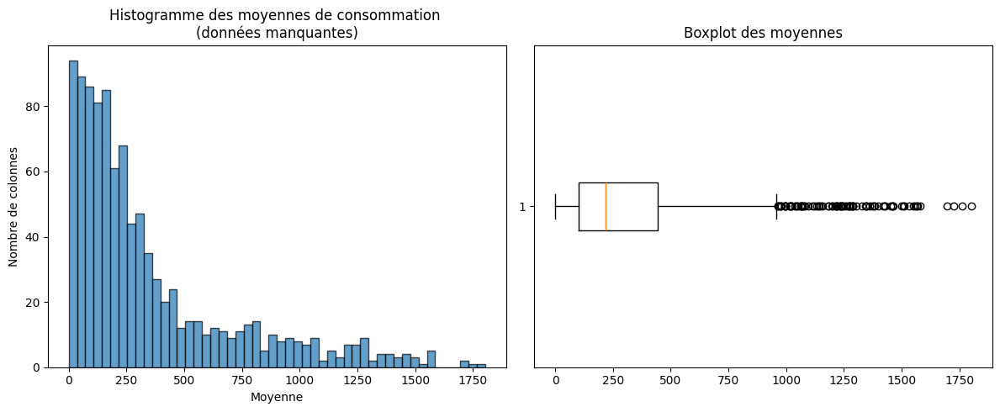

In [28]:
means_test = X_test.loc[:, holed_cols_test].mean(axis=0)

# Afficher un résumé numérique
print("Résumé des moyennes de consommation des données manquantes :\n", means_test.describe())

# Tracer la distribution : histogramme + boxplot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(means_test.dropna(), bins=50, color='C0', edgecolor='k', alpha=0.7)
plt.title("Histogramme des moyennes de consommation \n(données manquantes)")
plt.xlabel("Moyenne")
plt.ylabel("Nombre de colonnes")

plt.subplot(1, 2, 2)
plt.boxplot(means_test.dropna(), vert=False)
plt.title("Boxplot des moyennes")

plt.tight_layout()
plt.show()

Certaines valeurs moyennes sont très élevées, ce qui peut indiquer la présence de colonnes avec des niveaux de consommation anormalement hauts.
Nous allons étudier cela d'un peu plus près, et tracer leur niveau de consommation sur la période complète.

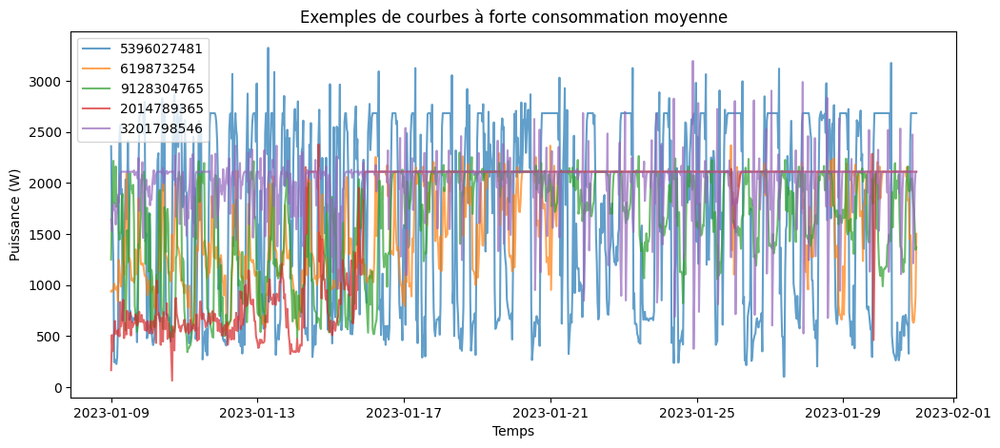

In [49]:
high_mean_cols = X_train.iloc[:, :-1000].columns[X_train.iloc[:, :-1000].mean() > X_train.iloc[:, :-1000].mean().quantile(0.99)]
plt.figure(figsize=(12,5))
for c in high_mean_cols[-5:]:
    plt.plot(X_train.index, X_train[c], alpha=0.7,label=c)
plt.title("Exemples de courbes à forte consommation moyenne")
plt.xlabel("Temps")
plt.ylabel("Puissance (W)")
plt.legend()
plt.show()


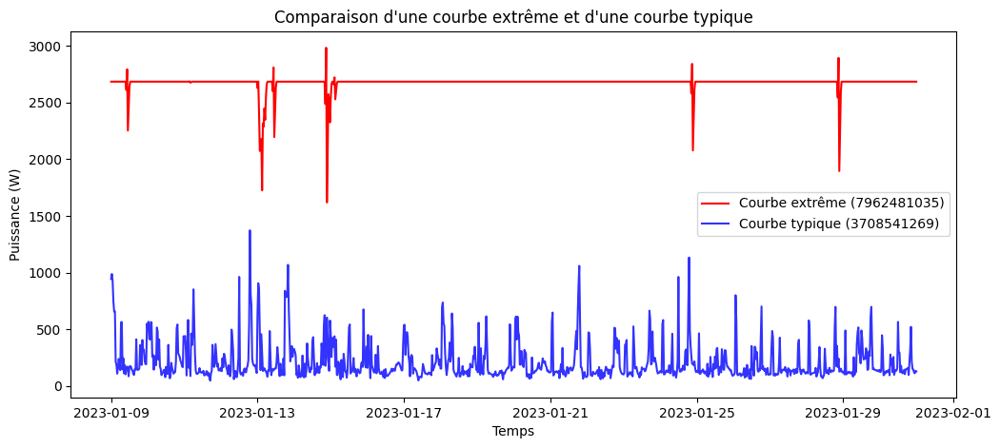

In [44]:
mean_by_col = X_train.iloc[:, :-1000].mean(axis=0)
col_high = mean_by_col.idxmax()                      # la plus haute moyenne
col_median = mean_by_col.sort_values().index[len(mean_by_col)//2]  # une médiane

plt.figure(figsize=(12,5))
plt.plot(X_train.index, X_train[col_high], label=f"Courbe extrême ({col_high})", color="red")
plt.plot(X_train.index, X_train[col_median], label=f"Courbe typique ({col_median})", color="blue", alpha=0.8)
plt.title("Comparaison d'une courbe extrême et d'une courbe typique")
plt.xlabel("Temps")
plt.ylabel("Puissance (W)")
plt.legend()
plt.show()

On se rend compte grâce à ces tracés que certaines colonnes présentent des niveaux de consommation très élevés de manière quasi constante.
Il faut donc également regarder la distrubutions de l'écart type des colonnes pour mieux comprendre la variabilité des niveaux de consommation.

### On trace désormais la distribution des écarts types des colonnes dans les données d'entrainement et de test.

Résumé des écarts-types (données connues) :
 count    20000.000000
mean       173.225741
std        156.880480
min          0.000000
25%         68.983880
50%        121.876717
75%        234.985393
max       1146.356427
dtype: float64


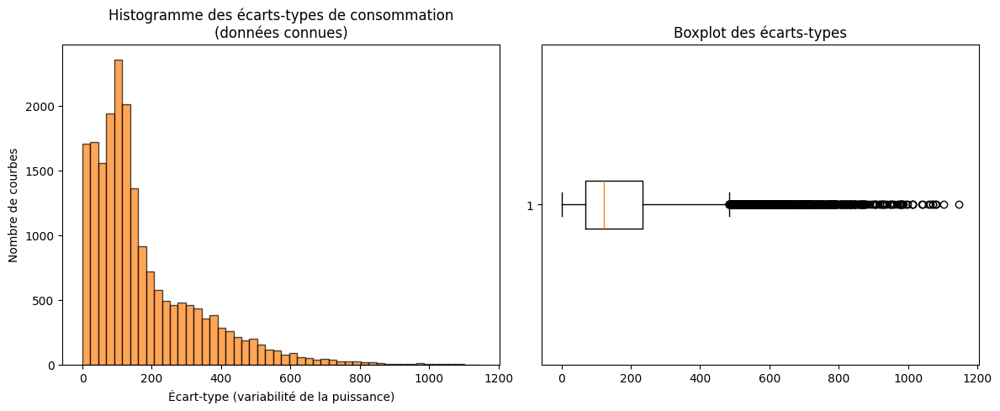

In [ ]:

# Calcul des écarts-types de chaque courbe (sauf les 1000 trouées)
stds = X_train.iloc[:, :-1000].std(axis=0)

# Résumé numérique
print("Résumé des écarts-types (données connues) :\n", stds.describe())

# Tracé : histogramme + boxplot
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(stds.dropna(), bins=50, color='C1', edgecolor='k', alpha=0.7)
plt.title("Histogramme des écarts-types de consommation\n(données connues)")
plt.xlabel("Écart-type (variabilité de la puissance)")
plt.ylabel("Nombre de courbes")

plt.subplot(1,2,2)
plt.boxplot(stds.dropna(), vert=False)
plt.title("Boxplot des écarts-types")

plt.tight_layout()
plt.show()


Résumé des écarts-types (données connues) :
 count    999.000000
mean     174.360838
std      159.285325
min        0.000000
25%       62.327514
50%      120.925026
75%      248.211623
max      977.717394
dtype: float64


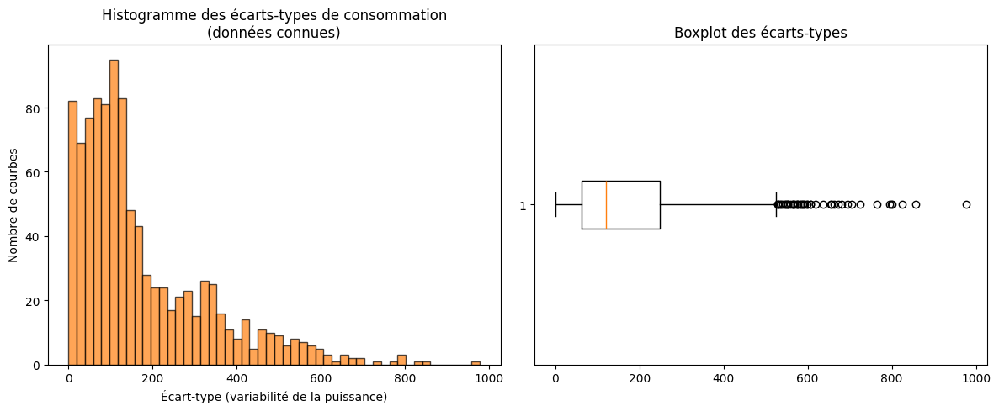

In [54]:
stds_holed = X_train[holed_cols].std(axis=0)


# Résumé numérique
print("Résumé des écarts-types (données connues) :\n", stds_holed.describe())

# Tracé : histogramme + boxplot
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(stds_holed.dropna(), bins=50, color='C1', edgecolor='k', alpha=0.7)
plt.title("Histogramme des écarts-types de consommation\n(données connues)")
plt.xlabel("Écart-type (variabilité de la puissance)")
plt.ylabel("Nombre de courbes")

plt.subplot(1,2,2)
plt.boxplot(stds_holed.dropna(), vert=False)
plt.title("Boxplot des écarts-types")

plt.tight_layout()
plt.show()



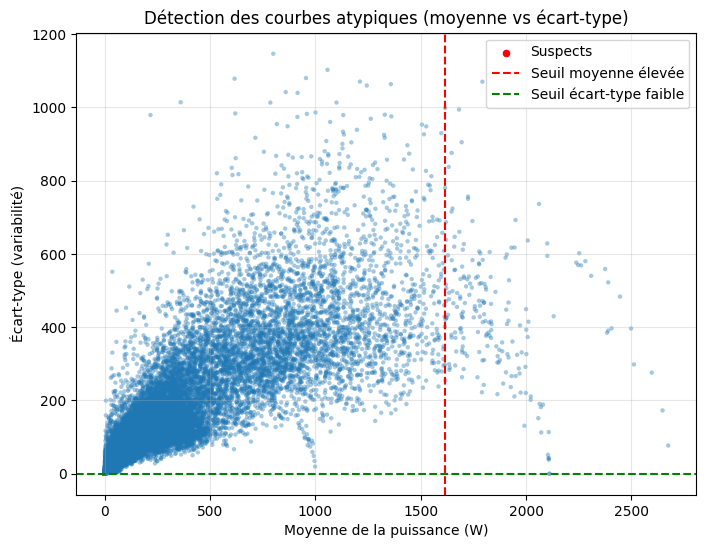

0 courbes identifiées comme hautes et plates.


In [59]:
mean_thresh_high = np.percentile(means, 99)   # très hautes moyennes
std_thresh_low = np.percentile(stds, 1)       # très faibles variabilités

plt.figure(figsize=(8,6))
plt.scatter(means, stds, alpha=0.4, s=10, color='C0', edgecolors='none')

# Marquage des outliers
mask_flat_high = (means > mean_thresh_high) & (stds < std_thresh_low)
plt.scatter(means[mask_flat_high], stds[mask_flat_high], color='red', s=20, label='Suspects')

# Tracés de lignes de seuils
plt.axvline(mean_thresh_high, color='r', linestyle='--', label='Seuil moyenne élevée')
plt.axhline(std_thresh_low, color='g', linestyle='--', label='Seuil écart-type faible')

plt.title("Détection des courbes atypiques (moyenne vs écart-type)")
plt.xlabel("Moyenne de la puissance (W)")
plt.ylabel("Écart-type (variabilité)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f"{mask_flat_high.sum()} courbes identifiées comme hautes et plates.")

Lors du preprocessing, nous pourrons envisager de supprimer les colonnes avec des niveaux de consommation très élevés et avec une faible variabilité (faible écart type).

### Traçons le  profil moyen journalier de l'ensemble des courbes

Horodate
0 days 00:30:00    1056
Name: count, dtype: int64


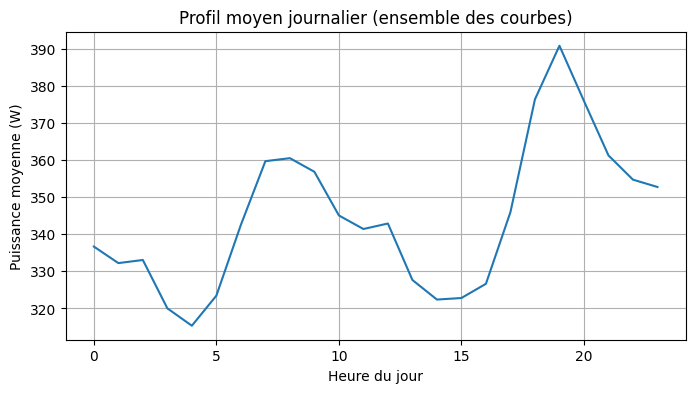

In [60]:
# Vérifier la fréquence des timestamps
print(X_train.index.to_series().diff().value_counts().head())

# Consommation moyenne globale par heure du jour
hourly_pattern = X_train.mean(axis=1).groupby(X_train.index.hour).mean()
plt.figure(figsize=(8,4))
plt.plot(hourly_pattern)
plt.title("Profil moyen journalier (ensemble des courbes)")
plt.xlabel("Heure du jour")
plt.ylabel("Puissance moyenne (W)")
plt.grid(True)
plt.show()


Le profil semble montrer des variations cohérentes au cours de la journée, avec des pics de consommation à certaines heures (7-8 heures, 19 heures) et des creux à d'autres moments (4 heures) .

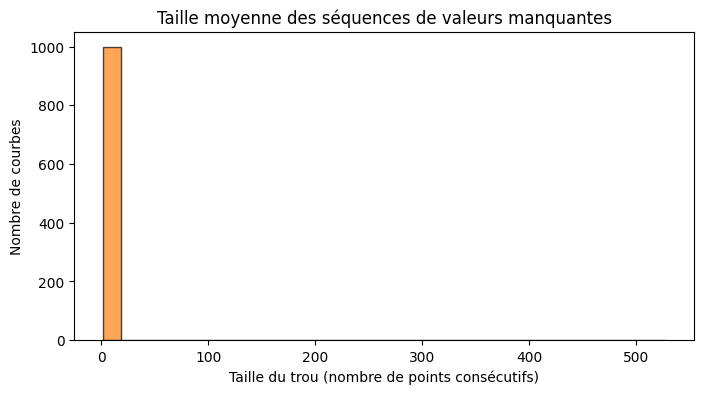

In [64]:
def missing_sequences(series):
    mask = series.isna()
    return (mask != mask.shift()).cumsum()[mask].value_counts().mean() if mask.any() else 0

hole_lengths = X_train[holed_cols].apply(missing_sequences)
plt.figure(figsize=(8,4))
plt.hist(hole_lengths, bins=30, color="C1", edgecolor="k", alpha=0.7)
plt.title("Taille moyenne des séquences de valeurs manquantes")
plt.xlabel("Taille du trou (nombre de points consécutifs)")
plt.ylabel("Nombre de courbes")
plt.show()
